# Middlebury Optical Flow Benchmark

Evaluates optical flow methods on the [Middlebury training set](https://vision.middlebury.edu/flow/data/),
which provides 8 sequences with publicly available ground truth:
Dimetrodon, Grove2, Grove3, Hydrangea, RubberWhale, Urban2, Urban3, Venus.

Datasets are downloaded automatically on first run.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import zipfile
import urllib.request
from pathlib import Path
from PIL import Image

from optical_flow import estimate_flow, flow_to_color, plot_flow, flow_angular_error
from optical_flow.io.flo_io import read_flo

%matplotlib inline

## 1. Download Middlebury Training Data

In [2]:
DATA_DIR = Path('..') / 'data'

DOWNLOADS = {
    'other-color-twoframes': 'https://vision.middlebury.edu/flow/data/comp/zip/other-color-twoframes.zip',
    'other-gt-flow': 'https://vision.middlebury.edu/flow/data/comp/zip/other-gt-flow.zip',
}

# Sequences with publicly available ground truth
SEQUENCES = [
    'Dimetrodon', 'Grove2', 'Grove3', 'Hydrangea',
    'RubberWhale', 'Urban2', 'Urban3', 'Venus',
]


def download_and_extract(name, url, data_dir):
    """Download a zip file and extract into data_dir if not already present."""
    marker = data_dir / f'.downloaded_{name}'
    if marker.exists():
        print(f'  {name}: already downloaded')
        return

    zip_path = data_dir / f'{name}.zip'
    data_dir.mkdir(parents=True, exist_ok=True)

    print(f'  {name}: downloading from {url} ...')
    urllib.request.urlretrieve(url, zip_path)

    print(f'  {name}: extracting ...')
    with zipfile.ZipFile(zip_path, 'r') as zf:
        zf.extractall(data_dir)

    zip_path.unlink()
    marker.touch()
    print(f'  {name}: done')


print('Checking Middlebury training data:')
for name, url in DOWNLOADS.items():
    download_and_extract(name, url, DATA_DIR)

# Verify all sequences are present
missing = [s for s in SEQUENCES
           if not (DATA_DIR / 'other-data' / s / 'frame10.png').exists()
           or not (DATA_DIR / 'other-gt-flow' / s / 'flow10.flo').exists()]
if missing:
    raise FileNotFoundError(f'Missing sequences: {missing}')
print(f'\nAll {len(SEQUENCES)} sequences with ground truth are available.')

Checking Middlebury training data:
  other-color-twoframes: already downloaded
  other-gt-flow: already downloaded

All 8 sequences with ground truth are available.


## 2. Preview Sequences

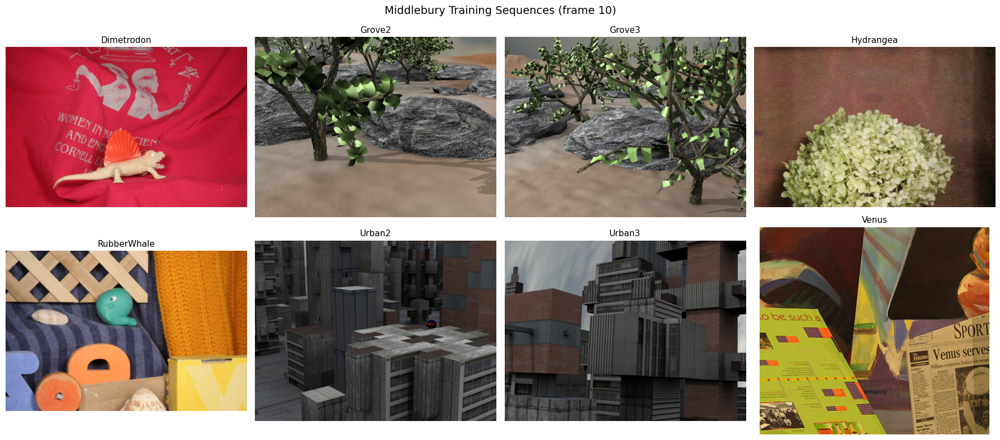

In [3]:
fig, axes = plt.subplots(2, 4, figsize=(18, 8))
for i, seq in enumerate(SEQUENCES):
    row, col = divmod(i, 4)
    im = Image.open(DATA_DIR / 'other-data' / seq / 'frame10.png')
    axes[row, col].imshow(im)
    axes[row, col].set_title(seq, fontsize=11)
    axes[row, col].axis('off')
plt.suptitle('Middlebury Training Sequences (frame 10)', fontsize=14)
plt.tight_layout()
plt.show()

## 3. Run Classic+NL-Fast on All Sequences

In [4]:
METHOD = 'classic+nl-fast'
UNKNOWN_THRESH = 1e9

results = []
flows = {}
gt_flows = {}

for seq in SEQUENCES:
    print(f'\n{"="*60}')
    print(f'Sequence: {seq}')
    print(f'{"="*60}')

    # Load images
    im1 = np.array(Image.open(DATA_DIR / 'other-data' / seq / 'frame10.png')).astype(float)
    im2 = np.array(Image.open(DATA_DIR / 'other-data' / seq / 'frame11.png')).astype(float)
    gt = read_flo(str(DATA_DIR / 'other-gt-flow' / seq / 'flow10.flo'))
    tu, tv = gt[:, :, 0], gt[:, :, 1]

    # Mask unknown flow (sentinel ~1.67e9)
    known = (np.abs(tu) < UNKNOWN_THRESH) & (np.abs(tv) < UNKNOWN_THRESH)

    # Estimate flow
    t0 = time.time()
    uv = estimate_flow(im1, im2, method=METHOD)
    elapsed = time.time() - t0

    # Evaluate only on known pixels
    aae, std_ae, aepe = flow_angular_error(tu, tv, uv[:, :, 0], uv[:, :, 1], border=0)

    results.append({
        'sequence': seq,
        'size': f'{im1.shape[1]}x{im1.shape[0]}',
        'aae': aae,
        'std_ae': std_ae,
        'aepe': aepe,
        'time': elapsed,
    })
    flows[seq] = uv
    gt_flows[seq] = gt

    print(f'AAE {aae:.3f}  EPE {aepe:.3f}  ({elapsed:.1f}s)')


Sequence: Dimetrodon
GNC stage: 1
  Pyramid level: 5
    Iter: 1 1 (delta: 4.232782)
    Iter: 2 1 (delta: 1.061053)
    Iter: 3 1 (delta: 1.017598)
  Pyramid level: 4
    Iter: 1 1 (delta: 5.474853)
    Iter: 2 1 (delta: 3.106616)
    Iter: 3 1 (delta: 3.080143)
  Pyramid level: 3
    Iter: 1 1 (delta: 16.739353)
    Iter: 2 1 (delta: 11.661721)
    Iter: 3 1 (delta: 11.572121)
  Pyramid level: 2
    Iter: 1 1 (delta: 49.172474)
    Iter: 2 1 (delta: 38.398432)
    Iter: 3 1 (delta: 38.131804)
  Pyramid level: 1
    Iter: 1 1 (delta: 244.409622)
    Iter: 2 1 (delta: 224.803742)
    Iter: 3 1 (delta: 221.118870)
GNC stage 1 finished, 0.70 minutes passed
GNC stage: 2
  Pyramid level: 2
    Iter: 1 1 (delta: 35.207847)
    Iter: 2 1 (delta: 12.727703)
    Iter: 3 1 (delta: 9.267278)
  Pyramid level: 1
    Iter: 1 1 (delta: 14.195794)
    Iter: 2 1 (delta: 13.641240)
    Iter: 3 1 (delta: 13.283320)
GNC stage 2 finished, 1.46 minutes passed
AAE 2.380  EPE 0.124  (88.4s)

Sequence: Grove

## 4. Results Table

In [5]:
print(f'Method: {METHOD}')
print(f'{"":-<70}')
print(f'{"Sequence":<16} {"Size":>10} {"AAE (deg)":>10} {"Std AE":>10} {"EPE (px)":>10} {"Time (s)":>10}')
print(f'{"":-<70}')
for r in results:
    print(f'{r["sequence"]:<16} {r["size"]:>10} {r["aae"]:>10.3f} {r["std_ae"]:>10.3f} {r["aepe"]:>10.3f} {r["time"]:>10.1f}')
print(f'{"":-<70}')

mean_aae = np.mean([r['aae'] for r in results])
mean_aepe = np.mean([r['aepe'] for r in results])
total_time = sum(r['time'] for r in results)
print(f'{"Average":<16} {"":>10} {mean_aae:>10.3f} {"":>10} {mean_aepe:>10.3f} {total_time:>10.1f}')

Method: classic+nl-fast
----------------------------------------------------------------------
Sequence               Size  AAE (deg)     Std AE   EPE (px)   Time (s)
----------------------------------------------------------------------
Dimetrodon          584x388      2.380      2.282      0.124       88.4
Grove2              640x480      1.396      4.689      0.096      128.5
Grove3              640x480      4.850     15.348      0.459      137.2
Hydrangea           584x388      1.939      5.672      0.159       90.3
RubberWhale         584x388      2.458      7.859      0.080       88.9
Urban2              640x480      1.878      6.791      0.197      135.4
Urban3              640x480      2.964     12.067      0.434      135.6
Venus               420x380      3.322      7.200      0.241       56.6
----------------------------------------------------------------------
Average                          2.649                 0.224      860.9


## 5. Estimated Flow Visualizations

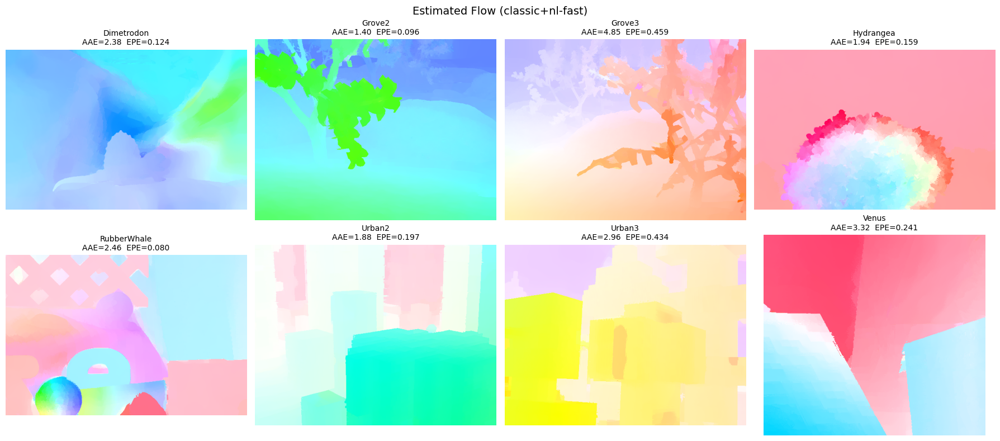

In [6]:
fig, axes = plt.subplots(2, 4, figsize=(18, 8))
for i, seq in enumerate(SEQUENCES):
    row, col = divmod(i, 4)
    ax = axes[row, col]
    color_img = flow_to_color(flows[seq])
    ax.imshow(color_img)
    r = results[i]
    ax.set_title(f'{seq}\nAAE={r["aae"]:.2f}  EPE={r["aepe"]:.3f}', fontsize=10)
    ax.axis('off')
plt.suptitle(f'Estimated Flow ({METHOD})', fontsize=14)
plt.tight_layout()
plt.show()

## 6. Ground Truth vs Estimated

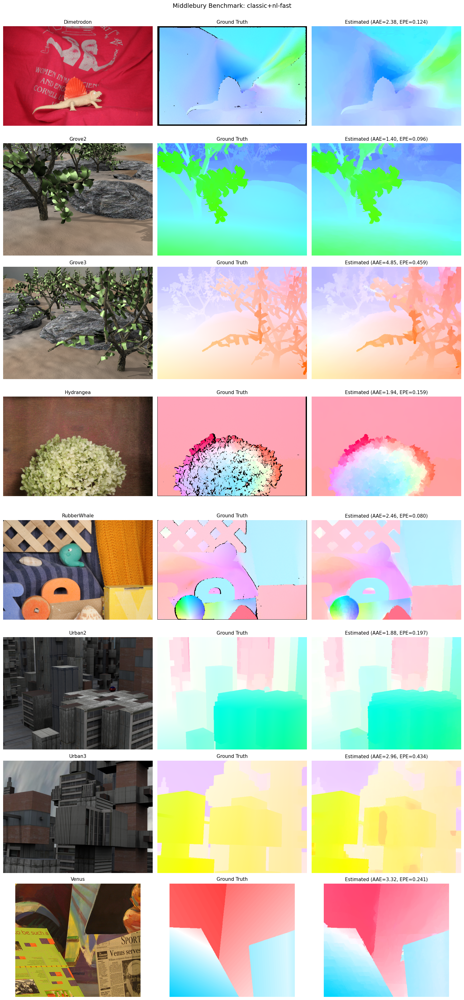

In [7]:
fig, axes = plt.subplots(len(SEQUENCES), 3, figsize=(15, 4 * len(SEQUENCES)))
for i, seq in enumerate(SEQUENCES):
    # Input image
    im = Image.open(DATA_DIR / 'other-data' / seq / 'frame10.png')
    axes[i, 0].imshow(im)
    axes[i, 0].set_title(f'{seq}', fontsize=11)
    axes[i, 0].axis('off')

    # Ground truth
    axes[i, 1].imshow(flow_to_color(gt_flows[seq]))
    axes[i, 1].set_title('Ground Truth', fontsize=11)
    axes[i, 1].axis('off')

    # Estimated
    r = results[i]
    axes[i, 2].imshow(flow_to_color(flows[seq]))
    axes[i, 2].set_title(f'Estimated (AAE={r["aae"]:.2f}, EPE={r["aepe"]:.3f})', fontsize=11)
    axes[i, 2].axis('off')

plt.suptitle(f'Middlebury Benchmark: {METHOD}', fontsize=14, y=1.0)
plt.tight_layout()
plt.show()

## 7. Error Maps

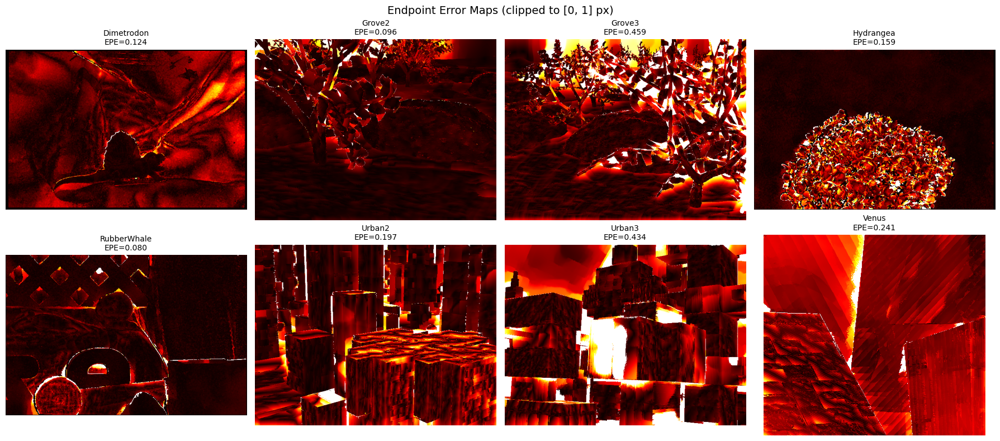

In [8]:
fig, axes = plt.subplots(2, 4, figsize=(18, 8))
for i, seq in enumerate(SEQUENCES):
    row, col = divmod(i, 4)
    ax = axes[row, col]

    gt = gt_flows[seq]
    est = flows[seq]
    tu, tv = gt[:, :, 0], gt[:, :, 1]

    # Endpoint error per pixel
    epe = np.sqrt((tu - est[:, :, 0])**2 + (tv - est[:, :, 1])**2)

    # Mask unknown
    unknown = (np.abs(tu) > UNKNOWN_THRESH) | (np.abs(tv) > UNKNOWN_THRESH)
    epe[unknown] = 0

    im = ax.imshow(epe, cmap='hot', vmin=0, vmax=1.0)
    ax.set_title(f'{seq}\nEPE={results[i]["aepe"]:.3f}', fontsize=10)
    ax.axis('off')

plt.suptitle('Endpoint Error Maps (clipped to [0, 1] px)', fontsize=14)
plt.tight_layout()
plt.show()

## 8. Method Comparison

In [ ]:
METHODS_TO_COMPARE = [
    'lk',
    'hs-brightness',
    'classic-c',
    'classic++',
    'classic+nl-fast',
]

# Run each method on all sequences
comparison = {m: [] for m in METHODS_TO_COMPARE}

for method in METHODS_TO_COMPARE:
    print(f'\nRunning {method} ...')
    for seq in SEQUENCES:
        im1 = np.array(Image.open(DATA_DIR / 'other-data' / seq / 'frame10.png')).astype(float)
        im2 = np.array(Image.open(DATA_DIR / 'other-data' / seq / 'frame11.png')).astype(float)
        gt = read_flo(str(DATA_DIR / 'other-gt-flow' / seq / 'flow10.flo'))

        t0 = time.time()
        uv = estimate_flow(im1, im2, method=method)
        elapsed = time.time() - t0

        aae, std_ae, aepe = flow_angular_error(
            gt[:, :, 0], gt[:, :, 1], uv[:, :, 0], uv[:, :, 1], border=0
        )
        comparison[method].append({
            'sequence': seq, 'aae': aae, 'aepe': aepe, 'time': elapsed
        })
        print(f'  {seq:<16} AAE={aae:.3f}  EPE={aepe:.3f}  ({elapsed:.1f}s)')

--------------------------------------------------------------------------------
Method                Dimetr  Grove2  Grove3  Hydran  Rubber  Urban2  Urban3   Venus     Avg
--------------------------------------------------------------------------------

AAE (degrees):
hs-brightness           4.69    2.32    5.91    2.69    4.58    4.61    6.61    5.25    4.58
classic-c               3.20    2.03    5.87    1.73    2.66    2.38    4.47    3.92    3.28
classic++               2.54    2.06    6.06    1.79    2.67    2.52    4.61    4.17    3.30
classic+nl-fast         2.38    1.40    4.85    1.94    2.46    1.88    2.96    3.32    2.65

EPE (pixels):
hs-brightness          0.225   0.165   0.624   0.233   0.142   0.545   0.729   0.315   0.372
classic-c              0.155   0.137   0.613   0.145   0.082   0.334   0.534   0.253   0.282
classic++              0.128   0.141   0.615   0.151   0.082   0.361   0.570   0.266   0.289
classic+nl-fast        0.124   0.096   0.459   0.159   0.080   

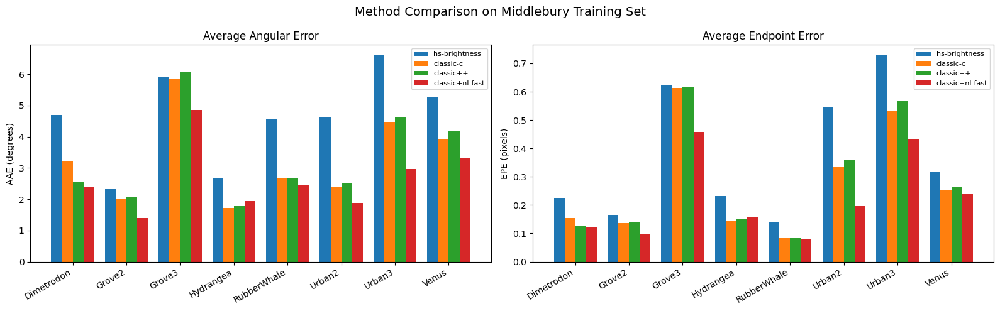

In [10]:
# Summary comparison table
print(f'{"":-<80}')
header = f'{"Method":<20}'
for seq in SEQUENCES:
    header += f' {seq[:6]:>7}'
header += f' {"Avg":>7}'
print(header)
print(f'{"":-<80}')

print('\nAAE (degrees):')
for method in METHODS_TO_COMPARE:
    row = f'{method:<20}'
    aaes = [r['aae'] for r in comparison[method]]
    for aae in aaes:
        row += f' {aae:>7.2f}'
    row += f' {np.mean(aaes):>7.2f}'
    print(row)

print('\nEPE (pixels):')
for method in METHODS_TO_COMPARE:
    row = f'{method:<20}'
    epes = [r['aepe'] for r in comparison[method]]
    for aepe in epes:
        row += f' {aepe:>7.3f}'
    row += f' {np.mean(epes):>7.3f}'
    print(row)

# Bar chart
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
x = np.arange(len(SEQUENCES))
width = 0.8 / len(METHODS_TO_COMPARE)

for i, method in enumerate(METHODS_TO_COMPARE):
    aaes = [r['aae'] for r in comparison[method]]
    epes = [r['aepe'] for r in comparison[method]]
    axes[0].bar(x + i * width, aaes, width, label=method)
    axes[1].bar(x + i * width, epes, width, label=method)

axes[0].set_ylabel('AAE (degrees)')
axes[0].set_xticks(x + width * (len(METHODS_TO_COMPARE) - 1) / 2)
axes[0].set_xticklabels(SEQUENCES, rotation=30, ha='right')
axes[0].legend(fontsize=8)
axes[0].set_title('Average Angular Error')

axes[1].set_ylabel('EPE (pixels)')
axes[1].set_xticks(x + width * (len(METHODS_TO_COMPARE) - 1) / 2)
axes[1].set_xticklabels(SEQUENCES, rotation=30, ha='right')
axes[1].legend(fontsize=8)
axes[1].set_title('Average Endpoint Error')

plt.suptitle('Method Comparison on Middlebury Training Set', fontsize=14)
plt.tight_layout()
plt.show()